In [ ]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


# STUDENT REFLECTION

Unfortunately, I did not reach baseline for binary, and only reached baseline for multi-class.

I tried a variety of things, looking at TensorFlow code, experimenting with the class notebooks using Pytorch to complete classification, etc.
But I remembered that I once took (but never finished) a course on Fast AI and I heard about its simplicity, so I wanted to try using it to complete the task at hand. I even showed it to Kenny, who showed it to others as well. Their classification was met with success, but mine was unbearbly worse. I even compared my code with theirs, and found no problem, but I just couldn't reach it.

I ran out of compute units for 4 email accounts, so I spent 10 dollars to get Colab Pro, only to finish spending all 100 compute units as well.

# **EDIT:**
I decided to calm down and work on the PyTorch tutorial notebook from class. And I was able to achieve excellent performance on binary! I ran out of time for multi-class, but I learned that sometimes instead of persisting, I need to know when to pivot.

In [ ]:
import pandas as pd
import os

In [ ]:
fold_df = pd.read_csv('/gdrive/Shareddrives/FTCM/CIS335 ML&AI/Final Project/Ian Liu Final Project/breakhis_data/Folds.csv')
fold_df

,fold,mag,grp,filename
0,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
1,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
2,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
3,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
4,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
...,...,...,...,...
39540,5,400,test,BreaKHis_v1/histology_slides/breast/malignant/...
39541,5,400,test,BreaKHis_v1/histology_slides/breast/malignant/...
39542,5,400,test,BreaKHis_v1/histology_slides/breast/malignant/...
39543,5,400,test,BreaKHis_v1/histology_slides/breast/malignant/...


In [ ]:
def return_type(filename: str):
  return filename.split('/')[5]

In [ ]:
fold_df['type'] =  fold_df['filename'].apply(return_type)
fold_df['type'].unique()

array(['adenosis', 'fibroadenoma', 'phyllodes_tumor', 'tubular_adenoma',
       'ductal_carcinoma', 'lobular_carcinoma', 'mucinous_carcinoma',
       'papillary_carcinoma'], dtype=object)

In [ ]:
# Check if each file exists
for indx, filename in enumerate(fold_df['filename']):
  if not os.path.exists( '/gdrive/Shareddrives/FTCM/CIS335 ML&AI/Final Project/Ian Liu Final Project/breakhis_data/BreaKHis_v1/'+  filename):
    print(indx)

In [ ]:
def return_target(filename: str):
  if 'malignant' in filename: return 1
  if 'benign' in filename: return 0
  return None

In [ ]:
fold_df['target'] =fold_df['filename'].apply(return_target)
fold_df

,fold,mag,grp,filename,type,target
0,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,adenosis,0
1,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,adenosis,0
2,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,adenosis,0
3,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,adenosis,0
4,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,adenosis,0
...,...,...,...,...,...,...
39540,5,400,test,BreaKHis_v1/histology_slides/breast/malignant/...,papillary_carcinoma,1
39541,5,400,test,BreaKHis_v1/histology_slides/breast/malignant/...,papillary_carcinoma,1
39542,5,400,test,BreaKHis_v1/histology_slides/breast/malignant/...,papillary_carcinoma,1
39543,5,400,test,BreaKHis_v1/histology_slides/breast/malignant/...,papillary_carcinoma,1


In [ ]:
# Make sure all targets are identified
fold_df['target'].unique()

array([0, 1])

In [ ]:
fold_df['is_valid'] = fold_df['grp']  == 'train'
entire_fold_df = fold_df.drop(['mag','fold', 'grp'], axis = 1)
entire_fold_df

,filename,type,target,is_valid
0,BreaKHis_v1/histology_slides/breast/benign/SOB...,adenosis,0,True
1,BreaKHis_v1/histology_slides/breast/benign/SOB...,adenosis,0,True
2,BreaKHis_v1/histology_slides/breast/benign/SOB...,adenosis,0,True
3,BreaKHis_v1/histology_slides/breast/benign/SOB...,adenosis,0,True
4,BreaKHis_v1/histology_slides/breast/benign/SOB...,adenosis,0,True
...,...,...,...,...
39540,BreaKHis_v1/histology_slides/breast/malignant/...,papillary_carcinoma,1,False
39541,BreaKHis_v1/histology_slides/breast/malignant/...,papillary_carcinoma,1,False
39542,BreaKHis_v1/histology_slides/breast/malignant/...,papillary_carcinoma,1,False
39543,BreaKHis_v1/histology_slides/breast/malignant/...,papillary_carcinoma,1,False


# Binary Classification

/usr/local/lib/python3.10/dist-packages/fastai/torch_core.py:263: UserWarning: 'has_mps' is deprecated, please use 'torch.backends.mps.is_built()'
  return getattr(torch, 'has_mps', False)


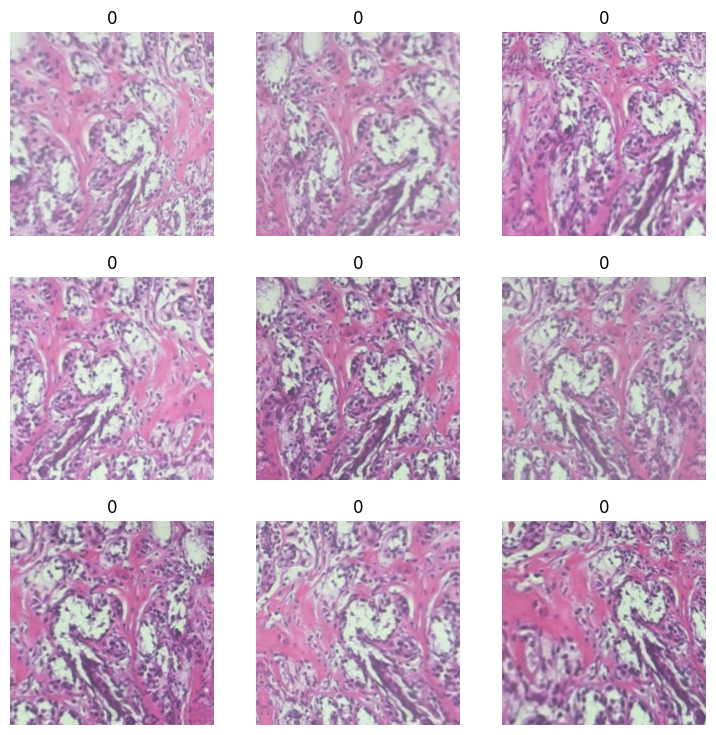

In [ ]:
from fastai.vision.all import *

tfms = [Rotate(), Zoom(), Warp(), Brightness(), Flip(), Contrast()]
comp = setup_aug_tfms(tfms)

# Load the data
dls = ImageDataLoaders.from_df(entire_fold_df, path='/gdrive/Shareddrives/FTCM/CIS335 ML&AI/Final Project/Ian Liu Final Project/breakhis_data/BreaKHis_v1/',
                               fn_col = 0, label_col=2, valid_col=3,
                                bs=32,
                                y_block=CategoryBlock,  # For classification tasks
                                item_tfms=Resize(244),
                                batch_tfms=comp)  # Data augmentation and resize for the batch

# Check out a batch of data
dls.show_batch(unique=True)


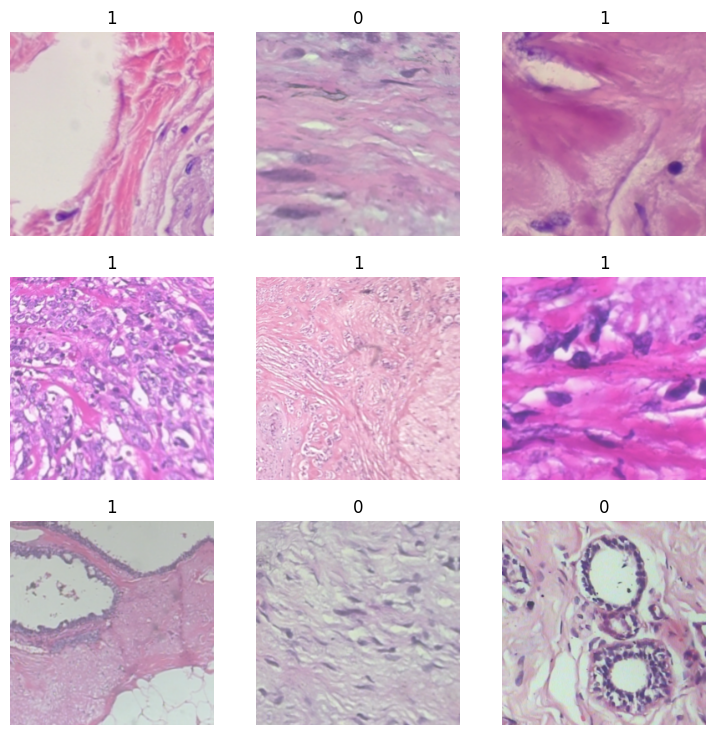

In [ ]:
dls.show_batch()

## ResNet 50

In [ ]:
learn50 = vision_learner(dls, resnet50, metrics=accuracy)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 151MB/s]


SuggestedLRs(valley=0.001737800776027143)

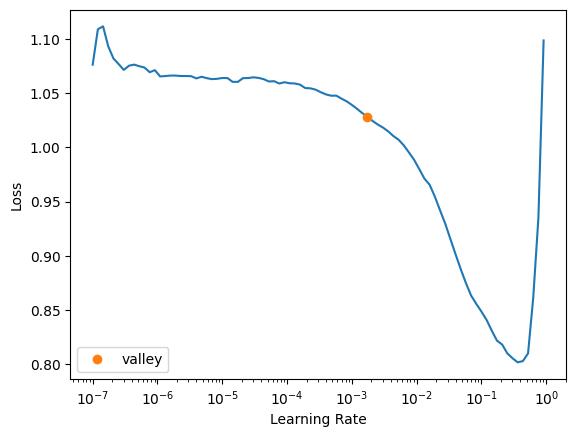

In [ ]:
learn50.lr_find()

In [ ]:
learn50.fine_tune(2, 0.001)

epoch,train_loss,valid_loss,accuracy,time
0,0.455902,0.332838,0.886360,36:39


epoch,train_loss,valid_loss,accuracy,time
0,0.217187,0.258609,0.917968,10:48
1,0.137822,0.220536,0.936862,10:54


In [ ]:
learn50.fine_tune(2, 0.001)

epoch,train_loss,valid_loss,accuracy,time
0,0.150028,0.250931,0.933539,10:39


epoch,train_loss,valid_loss,accuracy,time
0,0.106804,0.206608,0.949807,10:50
1,0.072875,0.209265,0.953787,10:58


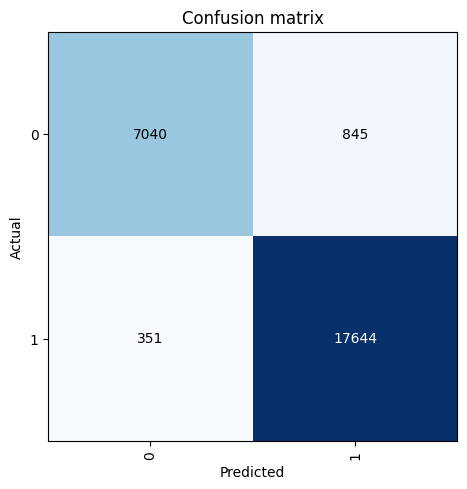

In [ ]:
interp50 = ClassificationInterpretation.from_learner(learn50)
interp50.plot_confusion_matrix()

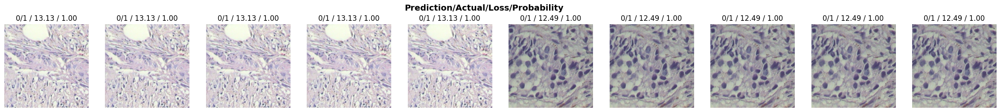

In [ ]:
interp50.plot_top_losses(10, nrows=1)

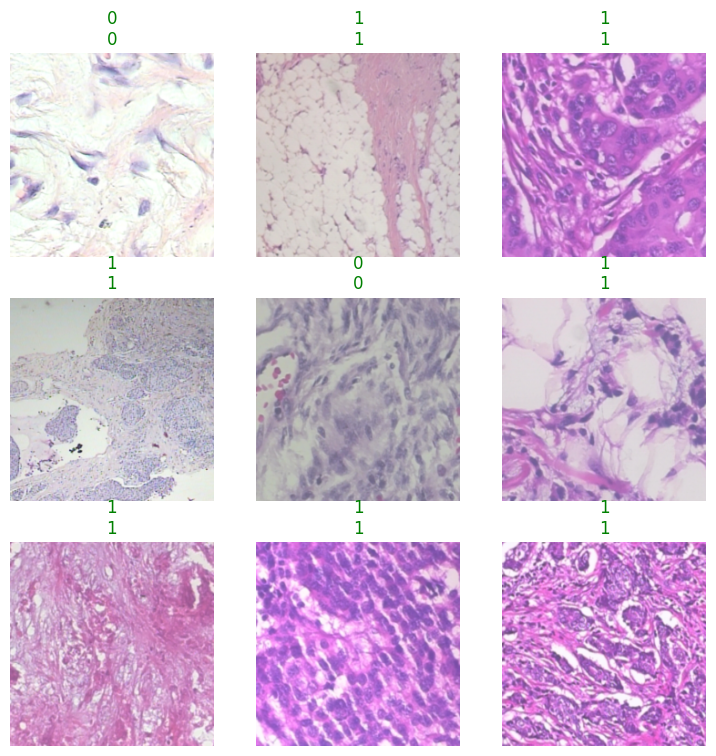

In [ ]:
learn50.show_results()

In [ ]:
learn50.export('binary_resnet50.pkl')

In [ ]:
learn50.save('binary_resnet50')


Path('/gdrive/Shareddrives/FTCM/CIS335 ML&AI/Final Project/Ian Liu Final Project/breakhis_data/BreaKHis_v1/models/binary_resnet50.pth')

## Resnet 152

In [ ]:
learn152 = vision_learner(dls, resnet152, metrics=accuracy)

Downloading: "https://download.pytorch.org/models/resnet152-f82ba261.pth" to /root/.cache/torch/hub/checkpoints/resnet152-f82ba261.pth
100%|██████████| 230M/230M [00:02<00:00, 87.4MB/s]


In [ ]:
learn152.fine_tune(10)

epoch,train_loss,valid_loss,accuracy,time
0,0.336298,0.369094,0.871754,12:39


epoch,train_loss,valid_loss,accuracy,time
0,0.156103,0.183578,0.943199,02:40
1,0.087512,0.222010,0.951777,02:40
2,0.071018,0.196952,0.957457,02:41
3,0.037064,0.233463,0.954482,02:41
4,0.020426,0.277528,0.955178,02:40
5,0.015918,0.258111,0.961476,02:41
6,0.009120,0.337695,0.961940,02:40
7,0.008312,0.357123,0.960549,02:40
8,0.002639,0.356494,0.960162,02:40
9,0.002261,0.367175,0.958462,02:40


In [ ]:
learn152.fine_tune(10)

epoch,train_loss,valid_loss,accuracy,time
0,0.006333,0.532478,0.958926,02:28


epoch,train_loss,valid_loss,accuracy,time
0,0.005492,0.458061,0.958269,02:41
1,0.006961,0.480829,0.960124,02:41
2,0.030422,0.406079,0.961167,02:41
3,0.009941,0.326773,0.961515,02:41
4,0.016073,0.421808,0.960394,02:41
5,0.006692,0.357657,0.960046,02:41
6,0.005480,0.402877,0.956685,02:40
7,0.004996,0.376203,0.959428,02:40
8,0.002420,0.361249,0.960665,02:41
9,0.002193,0.337131,0.961360,02:40


In [ ]:
learn152.fine_tune(10)

epoch,train_loss,valid_loss,accuracy,time
0,0.001261,0.472965,0.962017,02:29


epoch,train_loss,valid_loss,accuracy,time
0,0.002218,0.474468,0.961747,02:41
1,0.009460,0.662808,0.959119,02:42
2,0.010011,0.448292,0.960278,02:41
3,0.006293,0.476826,0.955951,02:41
4,0.009434,0.450989,0.957342,02:41
5,0.006197,0.335975,0.964683,02:41
6,0.003131,0.380325,0.959660,02:41
7,0.003618,0.412102,0.959815,02:41
8,0.001569,0.398036,0.960974,02:40
9,0.000764,0.412103,0.960974,02:40


epoch,train_loss,valid_loss,accuracy,time


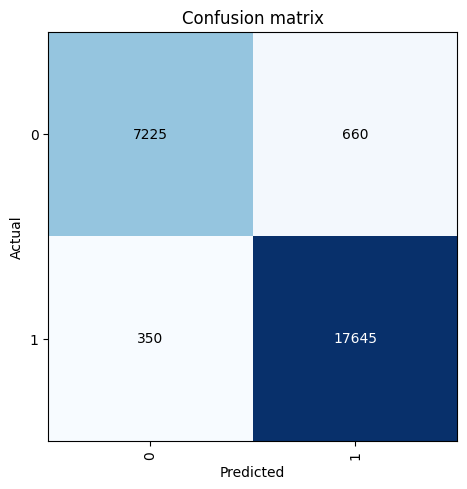

In [ ]:
interp152 = ClassificationInterpretation.from_learner(learn152)
interp152.plot_confusion_matrix()

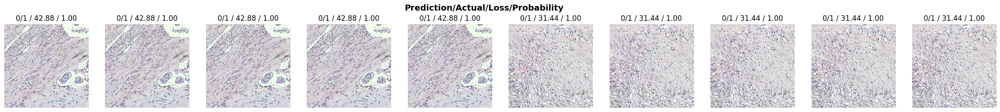

In [ ]:
interp152.plot_top_losses(10, nrows=1)

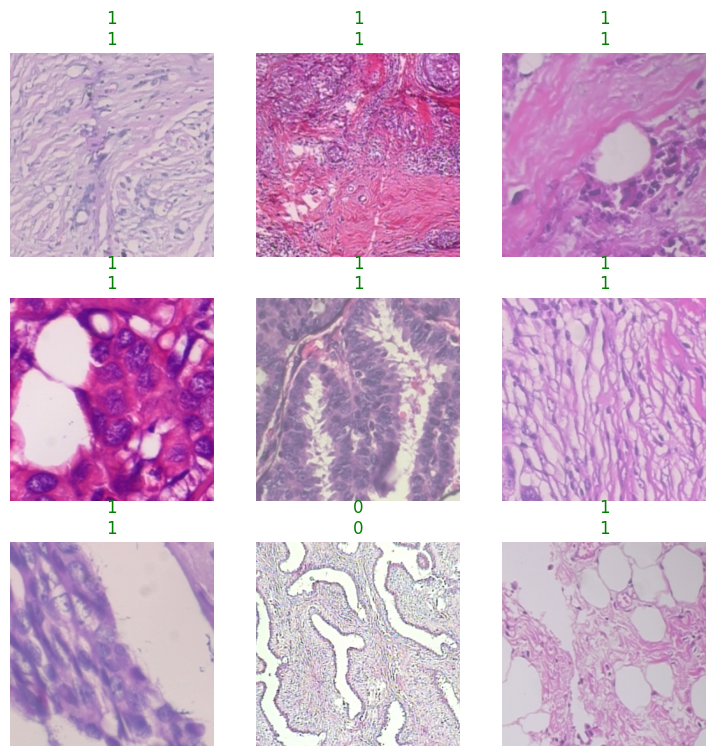

In [ ]:
learn152.show_results()

In [ ]:
learn152.export('binary_resnet152.pkl')

In [ ]:
learn152.save('binary_resenet152')

Path('/gdrive/Shareddrives/FTCM/CIS335 ML&AI/Final Project/Ian Liu Final Project/breakhis_data/BreaKHis_v1/models/binary_resenet152.pth')

## DenseNet 169

In [ ]:
learn169 = vision_learner(dls, densenet169, metrics=accuracy)

Downloading: "https://download.pytorch.org/models/densenet169-b2777c0a.pth" to /root/.cache/torch/hub/checkpoints/densenet169-b2777c0a.pth
100%|██████████| 54.7M/54.7M [00:00<00:00, 75.6MB/s]


In [ ]:
learn169.fine_tune(2)

epoch,train_loss,valid_loss,accuracy,time
0,0.278202,0.324334,0.907496,10:22


epoch,train_loss,valid_loss,accuracy,time
0,0.128150,0.170557,0.956491,03:32
1,0.049832,0.185455,0.959737,03:32


In [ ]:
learn169.fine_tune(1)

epoch,train_loss,valid_loss,accuracy,time
0,0.053540,0.261985,0.954173,03:18


epoch,train_loss,valid_loss,accuracy,time
0,0.043802,0.220227,0.962056,03:29


In [ ]:
learn169.fine_tune(1)

epoch,train_loss,valid_loss,accuracy,time
0,0.027561,0.247518,0.963060,03:52


epoch,train_loss,valid_loss,accuracy,time
0,0.034801,0.264958,0.960819,04:12


In [ ]:
learn169.fine_tune(1)

epoch,train_loss,valid_loss,accuracy,time
0,0.040790,0.241610,0.959930,03:53


epoch,train_loss,valid_loss,accuracy,time
0,0.042398,0.216872,0.963138,04:15


In [ ]:
learn169.fine_tune(1)

epoch,train_loss,valid_loss,accuracy,time
0,0.034415,0.295259,0.962828,03:55


epoch,train_loss,valid_loss,accuracy,time
0,0.023216,0.317866,0.961631,04:17


In [ ]:
learn169.fine_tune(1)

epoch,train_loss,valid_loss,accuracy,time
0,0.022667,0.406097,0.959699,03:58


epoch,train_loss,valid_loss,accuracy,time
0,0.030607,0.233569,0.964026,04:16


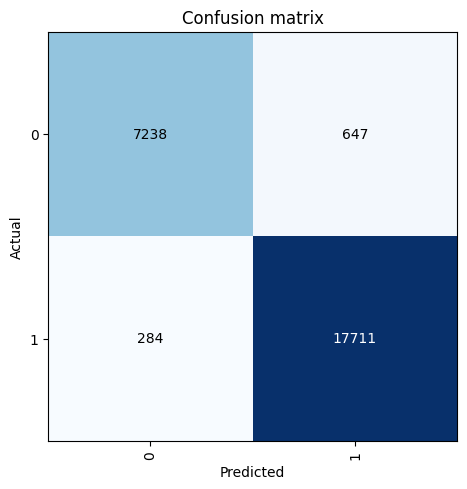

In [ ]:
interp169 = ClassificationInterpretation.from_learner(learn169)
interp169.plot_confusion_matrix()

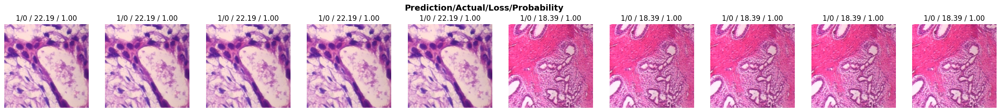

In [ ]:
interp169.plot_top_losses(10, nrows=1)

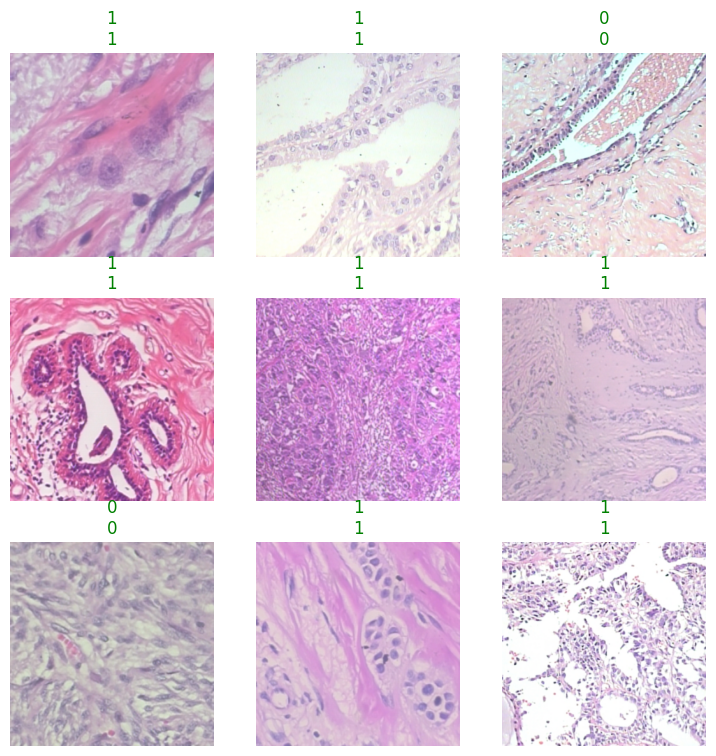

In [ ]:
learn169.show_results()

In [ ]:
learn169.export('binary_densenet169.pkl')

In [ ]:
learn169.save('binary_densenet169')

Path('/gdrive/Shareddrives/FTCM/CIS335 ML&AI/Final Project/Ian Liu Final Project/breakhis_data/BreaKHis_v1/models/binary_densenet169.pth')

## PyTorch Binary Transfer Learning

In [ ]:
import glob
import pandas as pd
import os
import tqdm


In [ ]:
fold_df = pd.read_csv('/gdrive/Shareddrives/FTCM/CIS335 ML&AI/Final Project/Ian Liu Final Project/breakhis_data/Folds.csv')
# fold_df['filename'] = '/gdrive/Shareddrives/FTCM/CIS335 ML&AI/Final Project/Ian Liu Final Project/breakhis_data/BreaKHis_v1/'+ fold_df['filename']
fold_df

,fold,mag,grp,filename
0,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
1,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
2,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
3,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
4,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
...,...,...,...,...
39540,5,400,test,BreaKHis_v1/histology_slides/breast/malignant/...
39541,5,400,test,BreaKHis_v1/histology_slides/breast/malignant/...
39542,5,400,test,BreaKHis_v1/histology_slides/breast/malignant/...
39543,5,400,test,BreaKHis_v1/histology_slides/breast/malignant/...


In [ ]:
def return_type(filename: str):
  return filename.split('/')[5]

In [ ]:
fold_df['type'] =  list(fold_df['filename'].apply(return_type))
fold_df['type'].unique()

array(['adenosis', 'fibroadenoma', 'phyllodes_tumor', 'tubular_adenoma',
       'ductal_carcinoma', 'lobular_carcinoma', 'mucinous_carcinoma',
       'papillary_carcinoma'], dtype=object)

In [ ]:
def return_target(filename: str):
  if 'malignant' in filename: return 1
  if 'benign' in filename: return 0
  return None

In [ ]:
fold_df['target'] = fold_df['filename'].apply(return_target)
fold_df.sample(5)

,fold,mag,grp,filename,type,target
15481,2,200,test,BreaKHis_v1/histology_slides/breast/malignant/...,mucinous_carcinoma,1
27695,4,200,train,BreaKHis_v1/histology_slides/breast/malignant/...,lobular_carcinoma,1
20496,3,100,train,BreaKHis_v1/histology_slides/breast/malignant/...,mucinous_carcinoma,1
36670,5,40,test,BreaKHis_v1/histology_slides/breast/benign/SOB...,adenosis,0
8025,2,400,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,adenosis,0


In [ ]:
# Make sure all targets are identified
fold_df['target'].unique()

array([0, 1])

In [ ]:
fold_df['is_valid'] = fold_df['grp']  == 'train'
entire_fold_df = fold_df.drop(['mag','fold', 'grp'], axis = 1)
entire_fold_df.sample(5)

,filename,type,target,is_valid
21556,BreaKHis_v1/histology_slides/breast/benign/SOB...,fibroadenoma,0,False
22466,BreaKHis_v1/histology_slides/breast/malignant/...,ductal_carcinoma,1,False
13053,BreaKHis_v1/histology_slides/breast/malignant/...,papillary_carcinoma,1,True
9706,BreaKHis_v1/histology_slides/breast/malignant/...,ductal_carcinoma,1,True
35869,BreaKHis_v1/histology_slides/breast/malignant/...,mucinous_carcinoma,1,True


In [ ]:
import pandas as pd
import os
import shutil

# Read the CSV file

# Directory where your original images are stored
original_dir = 'path_to_your_original_images_directory'

# New directory where you want to copy images
new_dir = '/gdrive/Shareddrives/FTCM/CIS335 ML&AI/Final Project/Ian Liu Final Project/temp_data_storage'

new_filepaths = []
# Iterate through the DataFrame
for index, row in fold_df.iterrows():
    original_filepath = os.path.join('/gdrive/Shareddrives/FTCM/CIS335 ML&AI/Final Project/Ian Liu Final Project/breakhis_data/BreaKHis_v1/',row['filename'] )

    # Check if the file exists
    if os.path.exists(original_filepath):
        # Construct new directory path
        new_folder_path = os.path.join(new_dir, row['grp'], str(row['target']))
        print(new_folder_path)

        # Create directory if it doesn't exist
        os.makedirs(new_folder_path, exist_ok=True)

        # Construct new file path
        new_file_path = os.path.join(new_folder_path, row['filename'].split('/')[-1])
        new_filepaths.append(new_file_path)

        # Copy the file
        shutil.copy(original_filepath, new_file_path)



### Transfer Learning for Computer Vision Tutorial
**Author**: [Sasank Chilamkurthy](https://chsasank.github.io)

In this tutorial, you will learn how to train a convolutional neural network for
image classification using transfer learning. You can read more about the transfer
learning at [cs231n notes](https://cs231n.github.io/transfer-learning/)_

Quoting these notes,

    In practice, very few people train an entire Convolutional Network
    from scratch (with random initialization), because it is relatively
    rare to have a dataset of sufficient size. Instead, it is common to
    pretrain a ConvNet on a very large dataset (e.g. ImageNet, which
    contains 1.2 million images with 1000 categories), and then use the
    ConvNet either as an initialization or a fixed feature extractor for
    the task of interest.

These two major transfer learning scenarios look as follows:

-  **Finetuning the convnet**: Instead of random initialization, we
   initialize the network with a pretrained network, like the one that is
   trained on imagenet 1000 dataset. Rest of the training looks as
   usual.
-  **ConvNet as fixed feature extractor**: Here, we will freeze the weights
   for all of the network except that of the final fully connected
   layer. This last fully connected layer is replaced with a new one
   with random weights and only this layer is trained.


In [ ]:
# License: BSD
# Author: Sasank Chilamkurthy
%matplotlib inline
from __future__ import print_function, division

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.backends.cudnn as cudnn
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy


cudnn.benchmark = True
plt.ion()   # interactive mode

### Load Data

We will use torchvision and torch.utils.data packages for loading the
data.

The problem we're going to solve today is to train a model to classify
**ants** and **bees**. We have about 120 training images each for ants and bees.
There are 75 validation images for each class. Usually, this is a very
small dataset to generalize upon, if trained from scratch. Since we
are using transfer learning, we should be able to generalize reasonably
well.

This dataset is a very small subset of imagenet.

.. Note ::
   Download the data from
   [here](https://download.pytorch.org/tutorial/hymenoptera_data.zip)
   and extract it to the current directory.



In [ ]:
# Data augmentation and normalization for training
# Just normalization for validation
# Doc: https://pytorch.org/vision/main/transforms.html
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'test': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

data_dir = "/gdrive/Shareddrives/FTCM/CIS335 ML&AI/Final Project/Ian Liu Final Project/temp_data_storage/"
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'test']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=32,
                                             shuffle=True, num_workers=4)
              for x in ['train', 'test']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'test']}
class_names = image_datasets['train'].classes

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


#### Visualize a few images
Let's visualize a few training images so as to understand the data
augmentations.



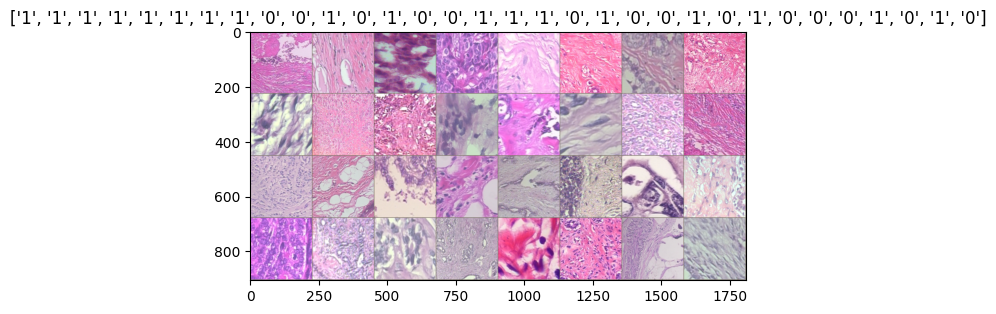

In [ ]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

### Training the model

Now, let's write a general function to train a model. Here, we will
illustrate:

-  Scheduling the learning rate
-  Saving the best model

In the following, parameter ``scheduler`` is an LR scheduler object from
``torch.optim.lr_scheduler``.



In [ ]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print(f'Epoch {epoch}/{num_epochs - 1}')
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'test']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            # deep copy the model
            if phase == 'test' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best test Acc: {best_acc:4f}')

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

#### Visualizing the model predictions

Generic function to display predictions for a few images




In [ ]:
def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['test']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title(f'predicted: {class_names[preds[j]]}')
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

### Finetuning the convnet

Load a pretrained model and reset final fully connected layer.




In [ ]:
model_ft = models.resnet152(pretrained=True)
# trained on ImageNet



/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet152_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet152_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
model_ft

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
m = nn.AdaptiveAvgPool2d((5,7))
input = torch.randn(1, 1, 8, 9)
output = m(input)


In [ ]:
input

tensor([[[[-0.2403, -0.5015,  0.1944,  0.5409,  0.9586,  0.2421, -0.9953,
           -0.1753,  1.3576],
          [-1.2594, -0.7694, -1.0662,  0.6945, -1.3851, -0.5906, -0.3318,
           -1.9811,  0.7137],
          [-1.4977, -0.1372, -0.3299, -0.4405,  1.3313, -0.1652, -0.1014,
            0.2054, -0.0603],
          [-1.5155,  0.2334, -0.2625, -0.1697, -0.2298,  0.9830, -0.8070,
            0.3335,  0.1511],
          [-0.4630,  1.2640,  0.3708, -3.4018, -1.9931, -1.7846,  0.2113,
            0.9568,  0.0532],
          [ 0.9563,  2.5495,  1.3100,  1.3918, -0.1683, -1.0298,  0.3674,
           -0.0665, -0.2518],
          [ 0.8486, -0.4772, -0.1296, -1.2190,  0.4622, -0.2271, -0.7792,
           -0.6446, -0.8480],
          [ 1.6193,  0.5210, -0.0124,  1.5061,  0.3801,  0.4997,  1.8169,
            0.0326, -0.3437]]]])

In [ ]:
output

tensor([[[[-0.6926, -0.5357,  0.0909,  0.0767, -0.4189, -0.8709, -0.0213],
          [-0.8243, -0.3886, -0.2624,  0.0031, -0.1688, -0.4471, -0.1063],
          [-0.1203,  0.4014, -0.8658, -1.0993, -0.3493,  0.1736,  0.3736],
          [ 0.7797,  0.8146, -0.2796, -0.8855, -0.5403,  0.0075, -0.1335],
          [ 0.6279, -0.0245,  0.0363,  0.2337,  0.3276,  0.1064, -0.4509]]]])

In [ ]:
num_ftrs = model_ft.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model_ft.fc = nn.Linear(num_ftrs, 2)

model_ft = model_ft.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

In [ ]:
model_ft

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

#### Train and evaluate

It should take around 15-25 min on CPU. On GPU though, it takes less than a
minute.




In [ ]:
model_ft = train_model(model_ft, criterion, optimizer_ft, exp_lr_scheduler,
                       num_epochs=10)

Epoch 0/9
----------
train Loss: 0.1350 Acc: 0.9470
test Loss: 0.0506 Acc: 0.9839

Epoch 1/9
----------
train Loss: 0.1119 Acc: 0.9571
test Loss: 0.0388 Acc: 0.9883

Epoch 2/9
----------
train Loss: 0.0947 Acc: 0.9647
test Loss: 0.0280 Acc: 0.9905

Epoch 3/9
----------
train Loss: 0.0894 Acc: 0.9664
test Loss: 0.0217 Acc: 0.9928

Epoch 4/9
----------
train Loss: 0.0750 Acc: 0.9751


KeyboardInterrupt: ignored

**YAY I ACHIEVED EXCELLENT PERFORMANCE FOR BINARY!!**

# Multiclass Classification

In [ ]:
tfms = [Rotate(), Zoom(), Warp(), Brightness(), Flip(), Contrast()]
comp = setup_aug_tfms(tfms)

# Load the data
dls = ImageDataLoaders.from_df(entire_fold_df, path='/gdrive/Shareddrives/FTCM/CIS335 ML&AI/Final Project/Ian Liu Final Project/breakhis_data/BreaKHis_v1/',
                               fn_col = 'filename', label_col='type', valid_col='is_valid',
                                bs=32,
                                item_tfms=Resize(320),
                                batch_tfms=comp)  # Data augmentation and resize for the batch

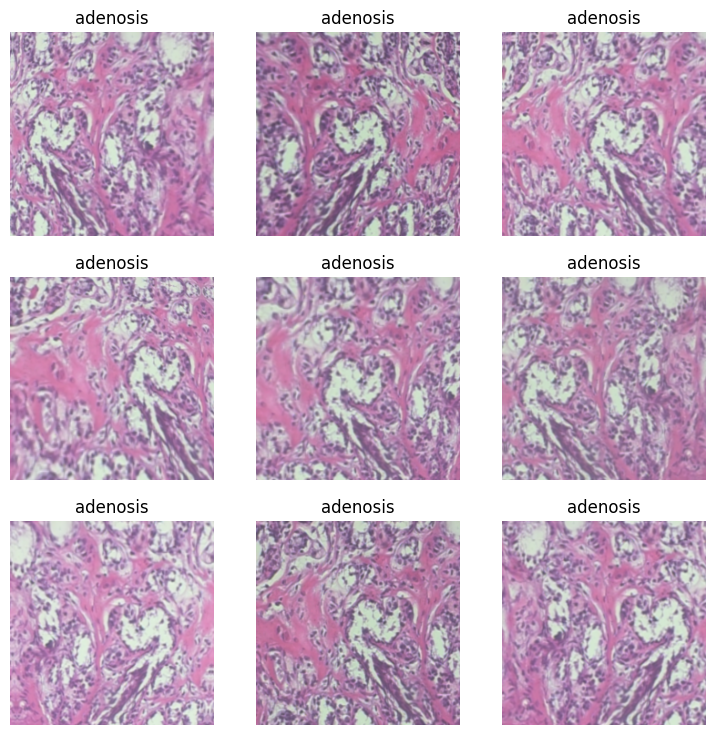

In [ ]:
# Check out a batch of data
dls.show_batch(unique=True)

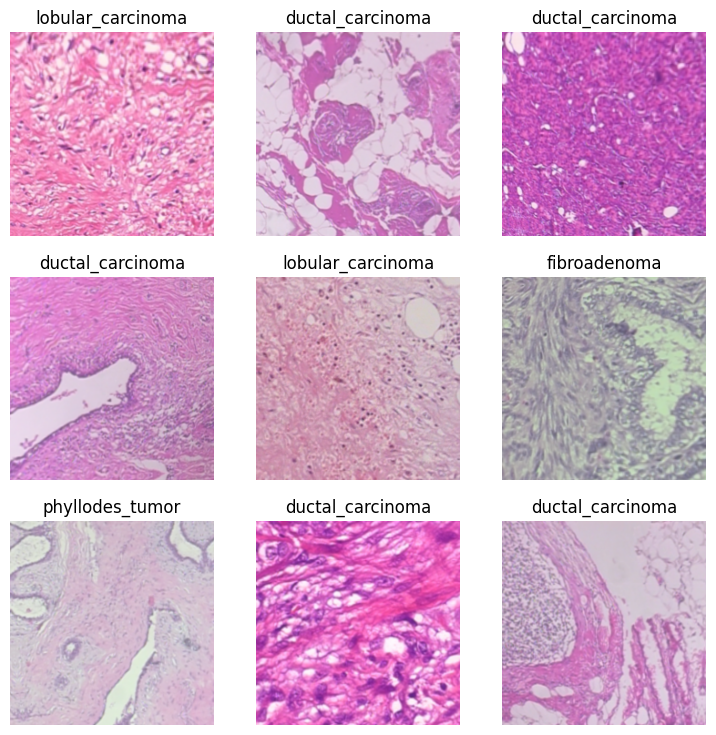

In [ ]:
dls.show_batch()

## ResNet 152 Multi-Class

In [ ]:
# learn152 = vision_learner(dls, resnet152, metrics=accuracy_multi)
learn152 = vision_learner(dls, resnet152, metrics=accuracy)

In [ ]:
# learn152.fine_tune(4)
learn152.fine_tune(3)

epoch,train_loss,valid_loss,accuracy,time
0,1.187982,1.055955,0.663408,39:16


epoch,train_loss,valid_loss,accuracy,time
0,0.546883,0.671795,0.807883,13:26
1,0.331345,0.564027,0.863872,13:33
2,0.209931,0.570518,0.881646,13:39


In [ ]:
learn152.fine_tune(8)

epoch,train_loss,valid_loss,accuracy,time
0,1.191328,1.048281,0.659969,03:05


epoch,train_loss,valid_loss,accuracy,time
0,0.628524,0.701740,0.783114,03:37
1,0.425125,0.627087,0.837558,03:39
2,0.293807,0.549114,0.873802,03:39
3,0.211946,0.613805,0.878516,03:38
4,0.132344,0.718342,0.886901,03:36
5,0.123991,0.709223,0.893972,03:36
6,0.069345,0.657346,0.891190,03:38
7,0.076295,0.697455,0.889645,03:36


In [ ]:
learn152.fine_tune(2)

epoch,train_loss,valid_loss,accuracy,time
0,0.103600,0.758017,0.892117,03:12


epoch,train_loss,valid_loss,accuracy,time
0,0.146160,0.737209,0.889799,03:36
1,0.094676,0.742685,0.895131,03:39


In [ ]:
learn152.fine_tune(6)

epoch,train_loss,valid_loss,accuracy,time
0,0.098438,0.843671,0.896677,03:16


epoch,train_loss,valid_loss,accuracy,time
0,0.102286,0.900010,0.888099,03:42
1,0.117976,0.777488,0.893972,03:39
2,0.115626,0.711298,0.893547,03:38
3,0.091988,0.814788,0.900657,03:38
4,0.044464,0.754816,0.901855,03:38
5,0.049327,0.763326,0.901198,03:38


In [ ]:
learn152.fine_tune(8)

epoch,train_loss,valid_loss,accuracy,time
0,0.059630,0.789869,0.899111,03:15


epoch,train_loss,valid_loss,accuracy,time
0,0.055643,0.758660,0.897566,03:39
1,0.099683,0.979178,0.891499,03:37
2,0.117551,0.709557,0.894281,03:38
3,0.071909,0.796722,0.895518,03:36
4,0.062907,0.741494,0.894706,03:37
5,0.054792,0.751764,0.896986,03:37
6,0.043885,0.750346,0.897643,03:38
7,0.026900,0.739926,0.898261,03:37


In [ ]:
learn152.fine_tune(8)

epoch,train_loss,valid_loss,accuracy,time
0,0.042567,0.819095,0.900155,03:15


epoch,train_loss,valid_loss,accuracy,time
0,0.043977,0.888239,0.895981,03:38
1,0.081453,1.010372,0.885278,03:38
2,0.104037,0.885244,0.893818,03:39
3,0.065478,0.922654,0.894165,03:38
4,0.062306,0.873395,0.895441,03:38
5,0.032724,0.900250,0.894590,03:38
6,0.034236,0.854249,0.893354,03:37
7,0.024661,0.896009,0.895518,03:38


In [ ]:
learn152.fine_tune(8)

epoch,train_loss,valid_loss,accuracy,time


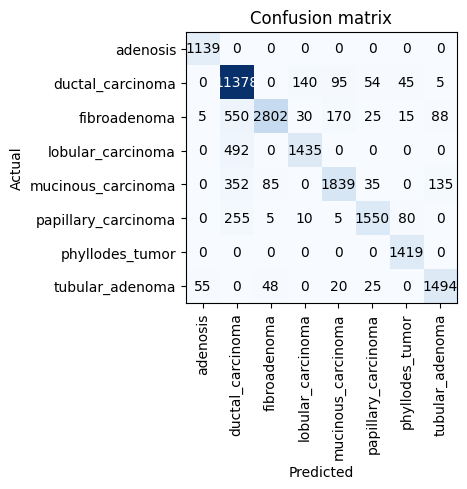

In [ ]:
interp152 = ClassificationInterpretation.from_learner(learn152)
interp152.plot_confusion_matrix()

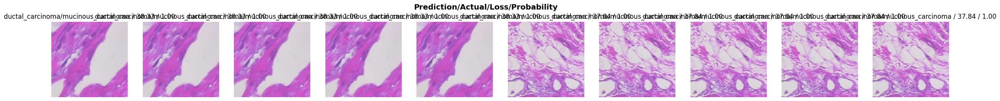

In [ ]:
interp152.plot_top_losses(10, nrows=1)

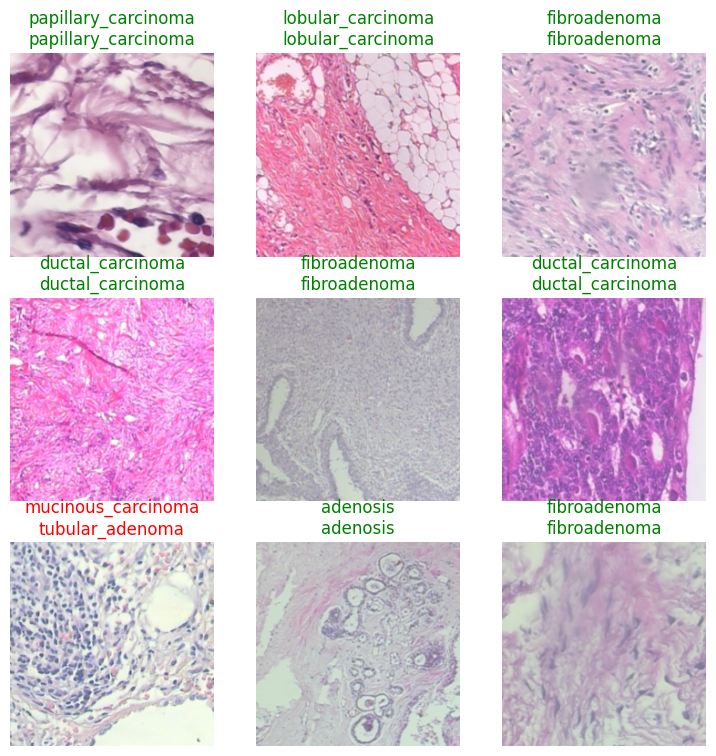

In [ ]:
learn152.show_results()

In [ ]:
learn152.export('multiclass_resnet152.pkl')

In [ ]:
learn152.save('multiclass_resnet152', with_opt=False)

Path('/gdrive/Shareddrives/FTCM/CIS335 ML&AI/Final Project/Ian Liu Final Project/breakhis_data/BreaKHis_v1/models/multiclass_resnet152.pth')

## ResNet 101 Multi-Class

In [ ]:
learn101 = vision_learner(dls, resnet101, metrics=accuracy)

Downloading: "https://download.pytorch.org/models/resnet101-cd907fc2.pth" to /root/.cache/torch/hub/checkpoints/resnet101-cd907fc2.pth
100%|██████████| 171M/171M [00:04<00:00, 36.9MB/s]


In [ ]:
learn101.fine_tune(10)

epoch,train_loss,valid_loss,accuracy,time
0,1.001407,0.947350,0.695015,05:06


epoch,train_loss,valid_loss,accuracy,time
0,0.569307,0.690516,0.803323,04:21
1,0.390093,0.653646,0.845518,04:19
2,0.305440,0.604767,0.851777,04:19
3,0.237154,0.624814,0.873300,04:19
4,0.168501,0.624900,0.881105,04:20
5,0.116383,0.593560,0.901932,04:20
6,0.081819,0.663857,0.901662,04:20
7,0.062325,0.699834,0.901198,04:18
8,0.051766,0.637936,0.901198,04:19
9,0.054972,0.653214,0.899768,04:20


In [ ]:
learn101.fine_tune(10)

epoch,train_loss,valid_loss,accuracy,time
0,0.091251,0.690044,0.902164,03:51


epoch,train_loss,valid_loss,accuracy,time
0,0.065547,0.718865,0.899343,04:19
1,0.098526,0.751774,0.897179,04:20
2,0.116214,0.744511,0.880603,04:18
3,0.103485,0.662308,0.892195,04:18
4,0.099529,0.819694,0.889219,04:20
5,0.073146,0.665543,0.905526,04:17
6,0.051924,0.745533,0.901468,04:19
7,0.038423,0.739153,0.903091,04:19
8,0.042108,0.756015,0.898338,04:18
9,0.036174,0.738090,0.899266,04:20


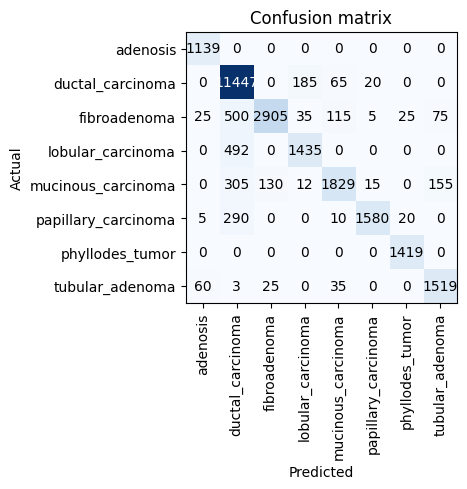

In [ ]:
interp101 = ClassificationInterpretation.from_learner(learn101)
interp101.plot_confusion_matrix()

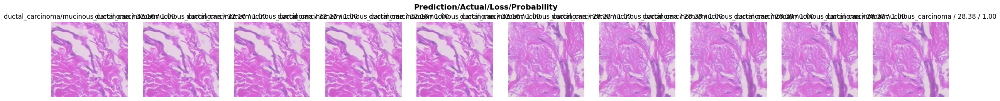

In [ ]:
interp101.plot_top_losses(10, nrows=1)

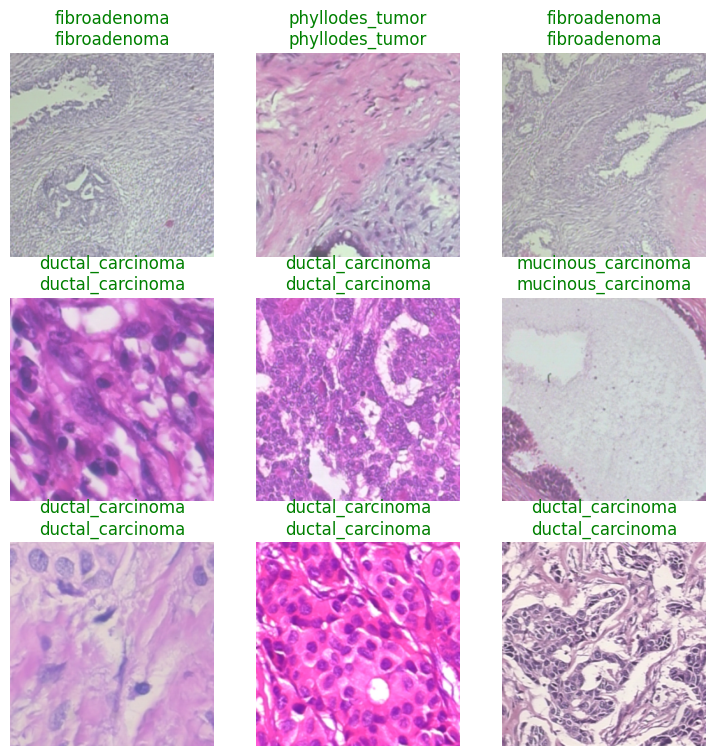

In [ ]:
learn101.show_results()

In [ ]:
learn101.export('multiclass_resnet101.pkl')

In [ ]:
learn101.save('multiclass_resnet101', with_opt=False)

Path('/gdrive/Shareddrives/FTCM/CIS335 ML&AI/Final Project/Ian Liu Final Project/breakhis_data/BreaKHis_v1/models/multiclass_resnet101.pth')

# Notable Problems That Occurred (besides the ones I complained about)

## Could not Match Class

In [ ]:
fold_df['type'] =  list(fold_df['filename'].apply(return_type))
fold_df['type'].unique()

array(['adenosis', 'fibroadenoma', 'phyllodes_tumor', 'tubular_adenoma',
       'ductal_carcinoma', 'lobular_carcinoma', 'mucinous_carcinoma',
       'papillary_carcinoma'], dtype=object)

/usr/local/lib/python3.10/dist-packages/fastai/torch_core.py:263: UserWarning: 'has_mps' is deprecated, please use 'torch.backends.mps.is_built()'
  return getattr(torch, 'has_mps', False)


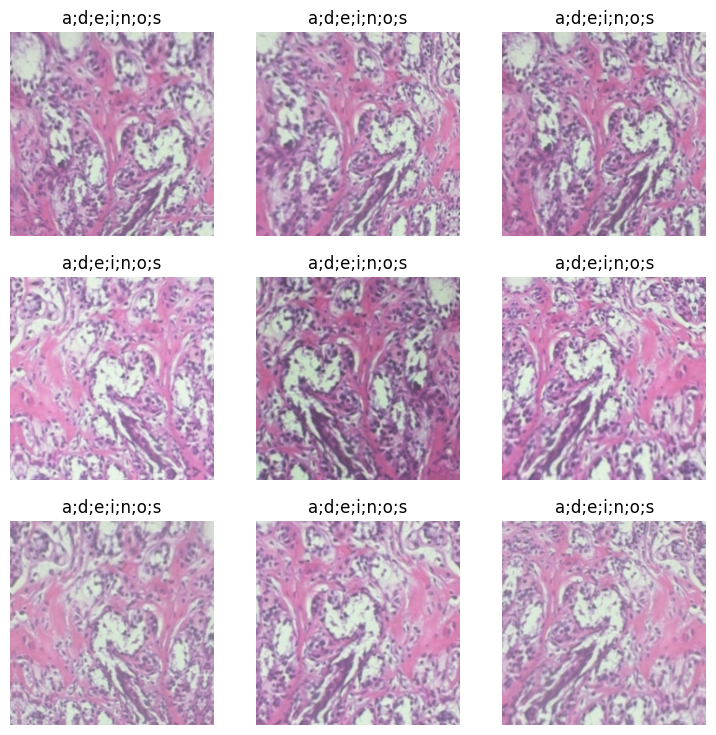

In [ ]:
tfms = [Rotate(), Zoom(), Warp(), Brightness(), Flip(), Contrast()]
comp = setup_aug_tfms(tfms)

# Load the data
dls = ImageDataLoaders.from_df(entire_fold_df, path='/gdrive/Shareddrives/FTCM/CIS335 ML&AI/Final Project/Ian Liu Final Project/breakhis_data/BreaKHis_v1/',
                               fn_col = 0, label_col=1, valid_col=3,
                                bs=32,
                                y_block=MultiCategoryBlock,  # For multi-class classification tasks
                                item_tfms=Resize(224),
                                batch_tfms=comp)  # Data augmentation and resize for the batch

# Check out a batch of data
dls.show_batch(unique=True)

## Confusion Matrix Error

I then changed all classes to single characters but still had an error like so:

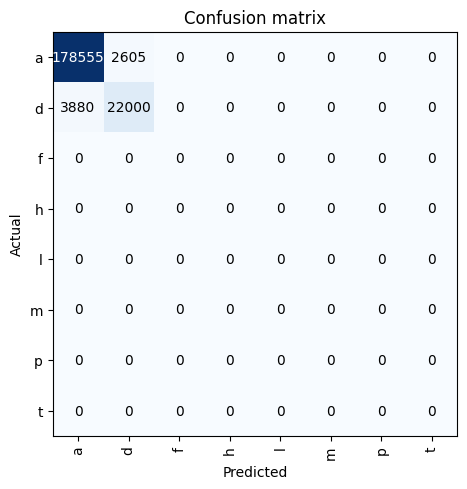

In [ ]:
interp = ClassificationInterpretation.from_learner(learn50)
interp.plot_confusion_matrix()